# Introduction
This notebook is here to outline the developmental progress of the FFT analysis of a density field in one, two and three dimensions. At this early stage of the project, this notebook simply intends to analyse the transformation between real space and k-space, specifically mapping the information present in the density field to a k-space representation.

## 1D case
This code is built to be the simplest way of performing a FFT on a dataset and will serve a useful purpose in learning the fundamental aspects of k-space.

In [2]:
#Import packages
from astropy import units
from astropy import constants
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as spy
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D

In [3]:
#This cell generates a 1D density field and performs a FFT
grid_x_size = 100 #Length of 1D grid
i=0
grid_init = np.zeros(grid_x_size, dtype=complex) #Initial state of grid
grid = grid_init
for i in range(0,grid_x_size):
    #grid.real[i] = np.random.normal() #Sample a Gaussian dist. for every cell
    if i < 100 and i > 0:
        grid.real[i] = np.exp(-0.1*(i-50)**2)
    
FFTgrid = np.fft.fft(grid) #Perform FFT on 1D grid
kvals = np.fft.fftfreq(grid_x_size)

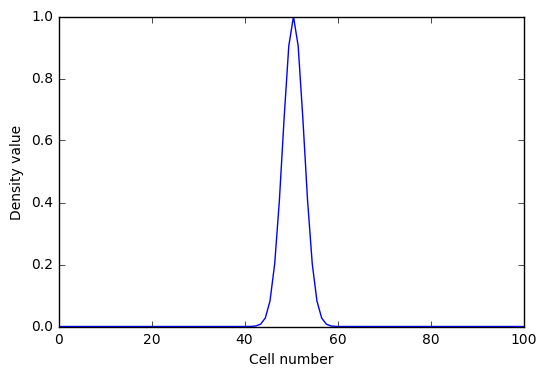

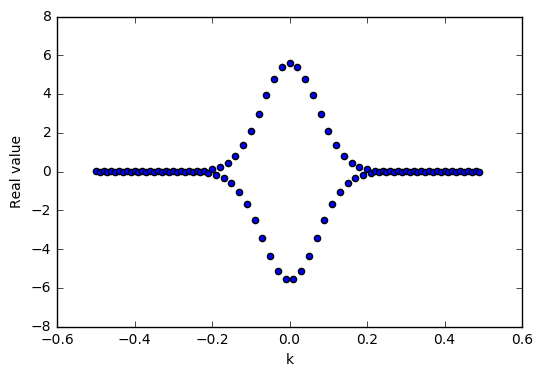

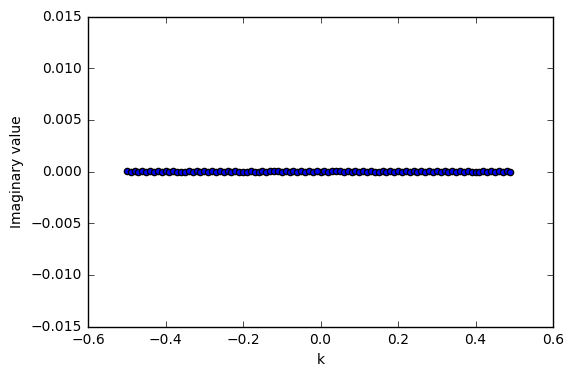

In [4]:
#Plot figures of 1D density field
plt.figure('Density Field (1D)')
plt.plot(np.linspace(0,grid_x_size,grid_x_size), grid.real)
plt.ylabel('Density value')
plt.xlabel('Cell number')

plt.figure('Real component of FFT field (1D)')
plt.scatter(kvals, FFTgrid.real)
plt.ylabel('Real value')
plt.xlabel('k')

plt.figure('Imaginary component of FFT field (1D)')
plt.scatter(kvals, FFTgrid.imag)
plt.ylabel('Imaginary value')
plt.xlabel('k')

plt.show()

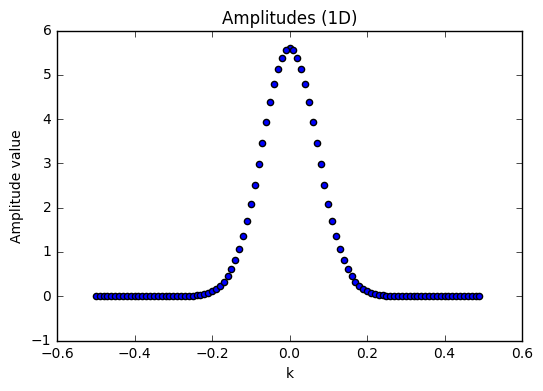

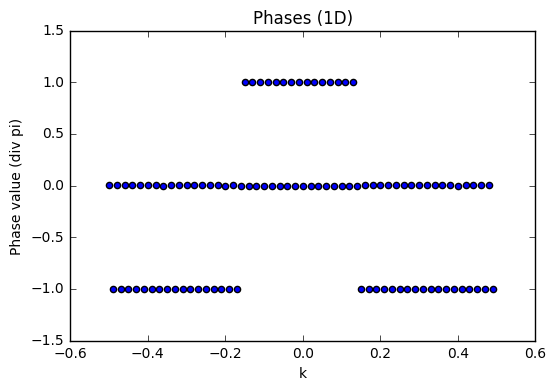

In [5]:
#This cell aims to plot amplitudes and phases from the Fourier coefficients
amplitudes = np.sqrt(FFTgrid.real**2 + FFTgrid.imag**2)
phases = np.arctan2(FFTgrid.imag, FFTgrid.real)
kvals = np.fft.fftfreq(len(amplitudes))

plt.figure('Amplitudes (1D)')
plt.scatter(kvals, amplitudes)
plt.title('Amplitudes (1D)')
plt.ylabel('Amplitude value')
plt.xlabel('k')

plt.figure('Phases(1D)')
plt.scatter(kvals, phases/np.pi)
plt.title('Phases (1D)')
plt.ylabel('Phase value (div pi)')
plt.xlabel('k')

plt.show()

## 2D case

In [6]:
#This cell generates a 2D density field and performs a FFT
grid_x_size = 300
grid_y_size = 300
outer_radius = 125
inner_radius = 125
i=0 
j=0
grid_init = np.zeros((grid_x_size, grid_y_size), dtype=complex)
grid = grid_init
for i in range(0,grid_x_size):
    for j in range(0,grid_y_size):
        grid.real[i,j] = np.random.normal() #Sample a Gaussian dist. for every cell
        #if np.sqrt((j-grid_x_size/2)**2+(i-grid_y_size/2)**2) < outer_radius:
        #    grid.real[i,j] += 1
        #if np.sqrt((j-grid_x_size/2)**2+(i-grid_y_size/2)**2) < inner_radius:
        #    grid.real[i,j] += 2
        j += 1
    i += 1
FFTgrid = np.fft.fft(grid)
k_x = np.fft.fftfreq(grid_x_size)
k_y = np.fft.fftfreq(grid_y_size)
kvals_x, kvals_y = np.meshgrid(k_x, k_y)

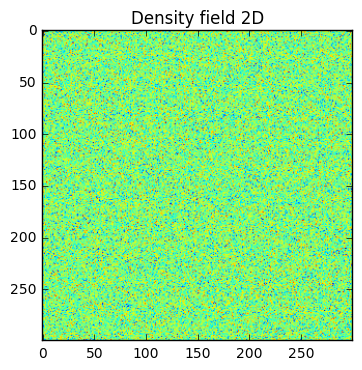

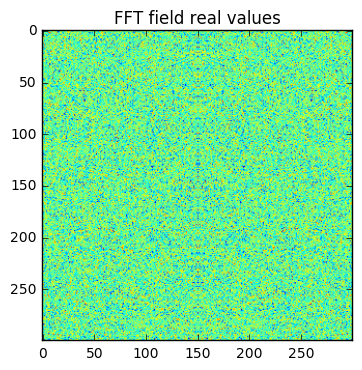

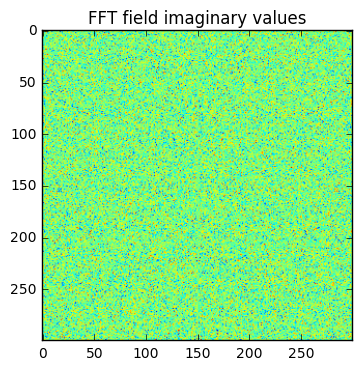

In [7]:
plt.figure('2D grid real values')
plt.imshow(grid.real)
plt.title('Density field 2D')

plt.figure('FFT real values')
plt.imshow(FFTgrid.real)
plt.title('FFT field real values')

plt.figure('FFT imaginary values')
plt.imshow(FFTgrid.imag)
plt.title('FFT field imaginary values')

plt.show()

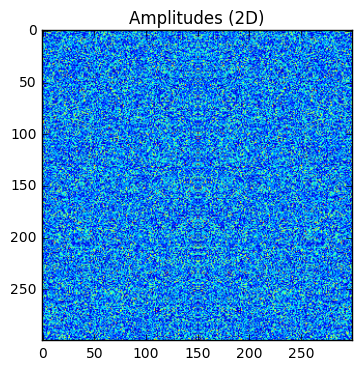

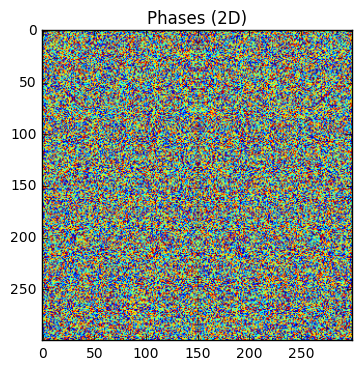

In [8]:
#This cell aims to plot amplitudes and phases from the Fourier coefficients
amplitudes = np.sqrt(FFTgrid.real**2 + FFTgrid.imag**2)
phases = np.arctan2(FFTgrid.imag, FFTgrid.real)
kvals = np.fft.fftfreq(len(amplitudes))

plt.figure('Amplitudes (2D)')
plt.imshow(amplitudes)
plt.title('Amplitudes (2D)')

plt.figure('Phases(2D)')
plt.imshow(phases)
plt.title('Phases (2D)')

plt.show()

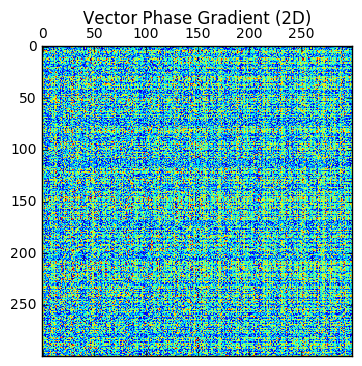

In [9]:
#Attempting to plot the phase gradient
phase_grad_x = phases[:+1,:]-phases[:,:]
phase_grad_y = phases[:,:+1]-phases[:,:]
vector_phase_grad = np.sqrt(phase_grad_x**2 + phase_grad_y**2) #Keep an eye on this statistic!

plt.figure('Phase Gradient (2D)')
plt.matshow(vector_phase_grad)
plt.title('Vector Phase Gradient (2D)')
plt.show()

## 3D Case

In [10]:
#This cell is dedicated to creating a 3 dimensional density field
field_length = 100*units.Mpc #Length of a single dimension in the density field. Total volume will be field_length^3.
resolution = 150 #Number of pixels in each dimension. Total number of pixels will be resolution^3.
L_array = np.linspace(0,field_length,resolution) #Array for values of length
kvals = 2*np.pi*np.fft.fftfreq(resolution, d=field_length/resolution) #Array for values of k
grid_init=np.zeros((resolution, resolution, resolution), dtype=complex) #Initial state of 3D grid (zeros)
grid = grid_init #Setting grid equal to the initial state
k_tot = np.zeros((resolution, resolution, resolution)) #Initialising the total k matrix
for i in range(0,resolution): #For loop to create a 3D grid
    for j in range(0,resolution):
        for k in range(0,resolution):
            grid[i,j,k] = np.random.normal(loc = 0.000301, scale=2668.74773828) #Assigns each pixel a GRF value (standardised to GiggleZ statistics)
            k_tot[i,j,k] = np.sqrt(kvals.value[i]**2+kvals.value[j]**2+kvals.value[k]**2) #Assigns each pixel a total k value

FFTgrid = np.fft.fft(grid) #Perform a Fourier Transform on the density field
GRFamplitudes = np.sqrt(FFTgrid.real**2 + FFTgrid.imag**2)
GRFphases = np.arctan2(FFTgrid.imag, FFTgrid.real)

C:\Users\Simon\Anaconda3\lib\site-packages\ipykernel\__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


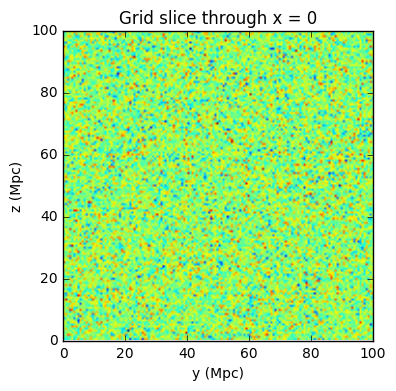

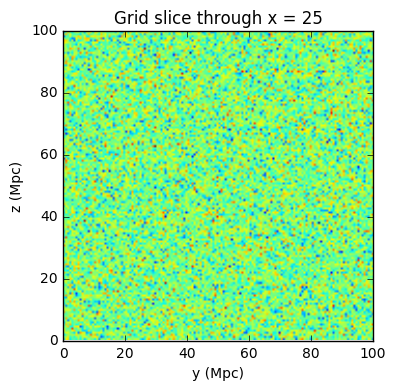

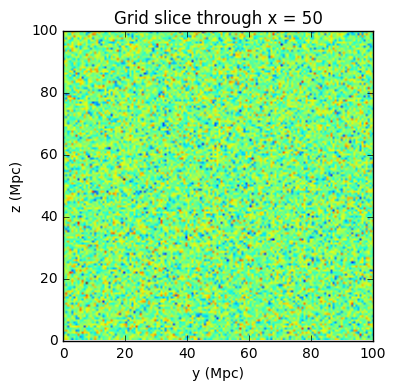

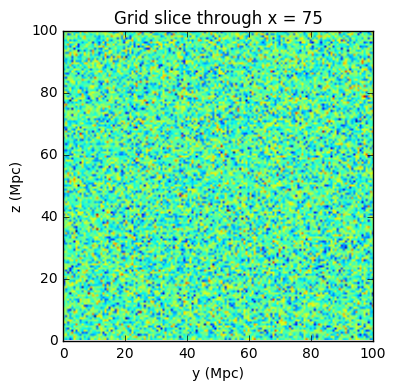

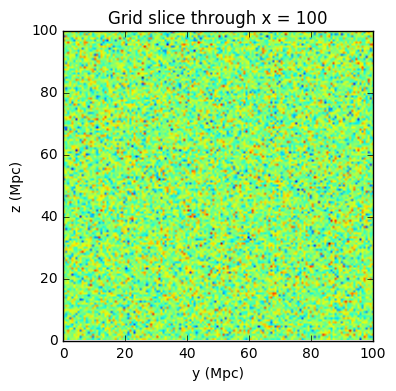

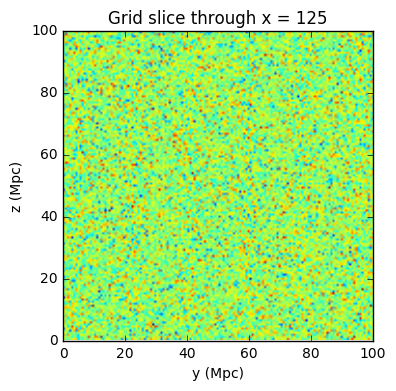

In [11]:
k_tot *= 1/units.Mpc #Adds units to values of total k
x_sections = 6 #Number of slices to take through grid


for t in range(0,x_sections): #Plots a number of 2D slices of the grid
    x_num = t*resolution/x_sections
    plt.figure('Slice x = ' + str(int(x_num)))
    plt.imshow(grid.real[x_num,:,:], extent=[0.,field_length.value, 0., field_length.value])
    plt.title('Grid slice through x = ' + str(int(x_num)))
    plt.xlabel('y (Mpc)')
    plt.ylabel('z (Mpc)')
    plt.show()

C:\Users\Simon\Anaconda3\lib\site-packages\ipykernel\__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


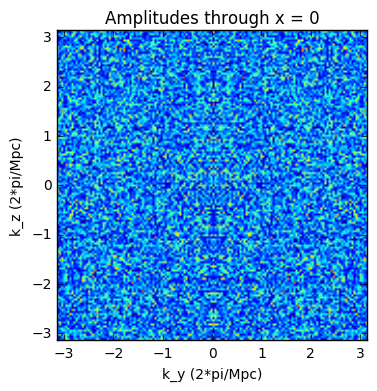

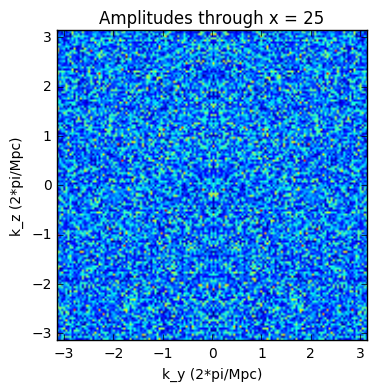

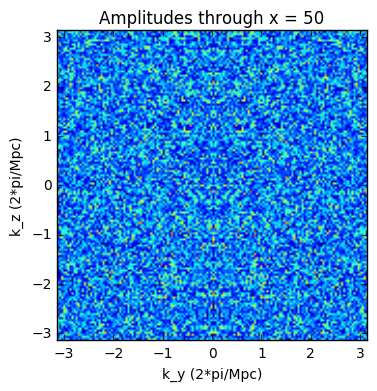

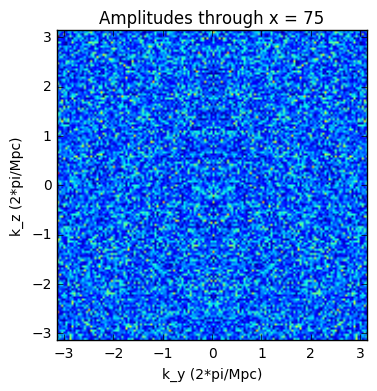

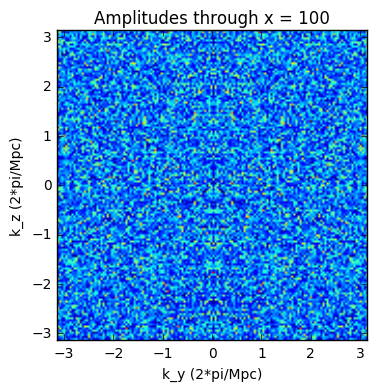

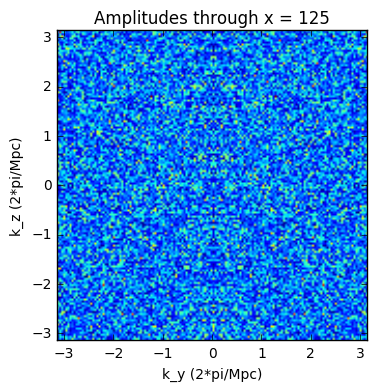

In [12]:
for t in range(0,x_sections): #Plots a number of 2D slices of the grid
    x_num = t*resolution/x_sections
    plt.figure('Amplitudes')
    plt.imshow(GRFamplitudes[x_num,:,:], extent=[-np.pi,np.pi , -np.pi,np.pi])
    plt.title('Amplitudes through x = ' + str(int(x_num)))
    plt.xlabel('k_y (2*pi/Mpc)')
    plt.ylabel('k_z (2*pi/Mpc)')
    plt.show()

C:\Users\Simon\Anaconda3\lib\site-packages\ipykernel\__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


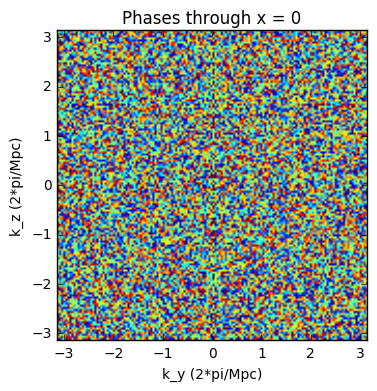

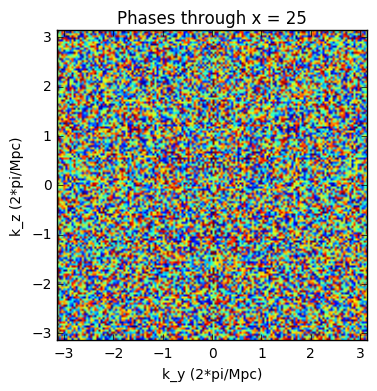

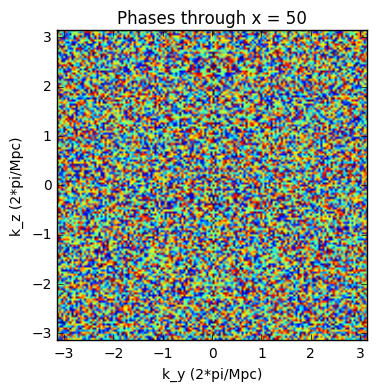

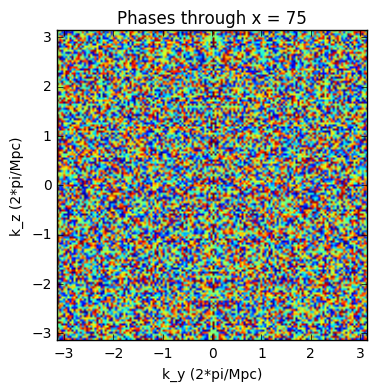

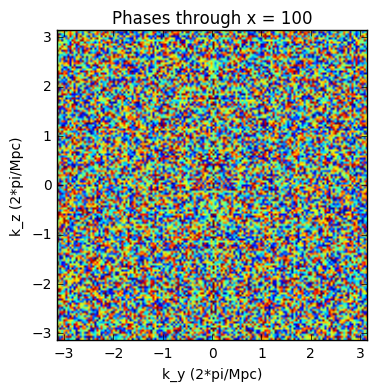

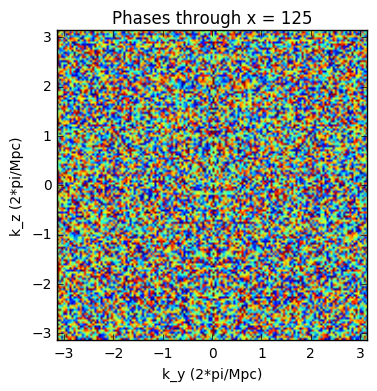

In [13]:
for t in range(0,x_sections): #Plots a number of 2D slices of the grid
    x_num = t*resolution/x_sections
    plt.figure('Phases')
    plt.imshow(GRFphases[x_num,:,:], extent=[-np.pi,np.pi , -np.pi,np.pi])
    plt.title('Phases through x = ' + str(int(x_num)))
    plt.xlabel('k_y (2*pi/Mpc)')
    plt.ylabel('k_z (2*pi/Mpc)')
    plt.show()

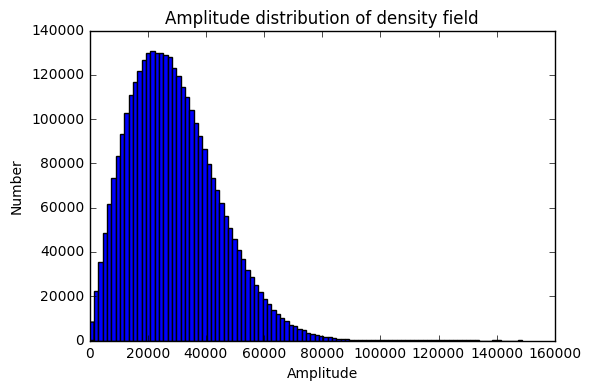

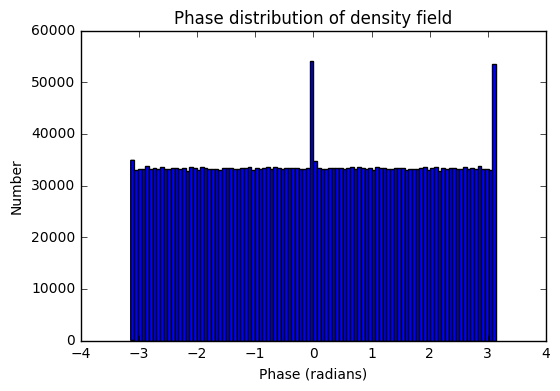

In [14]:
plt.figure('Amplitude_dist')
plt.hist(GRFamplitudes.flatten(), bins=100)
plt.title('Amplitude distribution of density field')
plt.ylabel('Number')
plt.xlabel('Amplitude')
plt.show()

plt.figure('phase_dist')
plt.hist(GRFphases.flatten(), bins=100)
plt.title('Phase distribution of density field')
plt.ylabel('Number')
plt.xlabel('Phase (radians)')
plt.show()

## Using GiggleZ cutout dataset
This section is dedicated to replicating the plots and calculations of the above section, this time on a dataset cutout from the GiggleZ simulation.

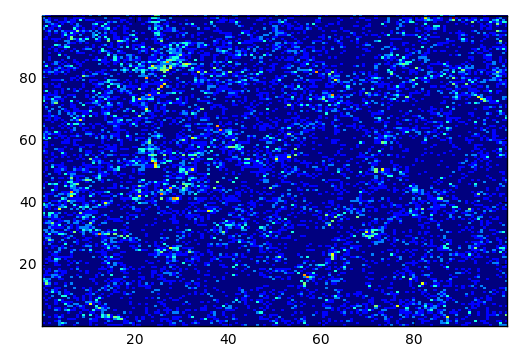

In [15]:
#This cell loads the data from the simulation_cutout.dat dataset
data = np.loadtxt('C:/Users/Simon/Documents/Honours/Phases of the Universe/simulation_cutout.dat') #Load data file
x_dat, y_dat, z_dat = data[:,0], data[:,1], data[:,2] #Assign x, y and z data values from columns 1, 2 and 3 from the data file

plt.figure() #plot a 2D histogram to roughly check the density field
plt.hist2d(y_dat, z_dat, bins=150)
plt.show()

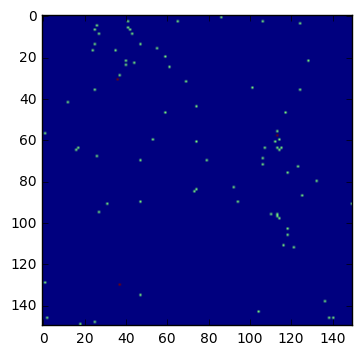

In [16]:
#bin the particle positions into a grid
nx,ny,nz = 150,150,150 #number of bins in x, y and z. Stick to powers of 2!
lx,ly,lz = 100,100,100 #needs units (Mpc/h)! #length of each dimension
dx,dy,dz = lx/nx,ly/ny,lz/nz #length of each bin
datagrid = np.zeros((nx,ny,nz)) #initialize the data grid
datagrid, edges = np.histogramdd(np.vstack([x_dat,y_dat,z_dat]).transpose(),bins=(nx,ny,nz),range=((0.,lx),(0.,ly),(0.,lz))) #bin data
kx = np.fft.fftfreq(nx)
ky = np.fft.fftfreq(ny)
kz = np.fft.fftfreq(nz)
k_tot = np.sqrt(kx[:,np.newaxis,np.newaxis]**2 + ky[np.newaxis,:,np.newaxis]**2 + kz[np.newaxis,np.newaxis,:]**2)

mean_density = (nx+ny+nz)/(lx*ly*lz)
overdensities = datagrid/mean_density + 0j
FFTfield = np.fft.fft(overdensities) #Perform a Fourier Transform on the density field
amplitudes = np.sqrt(FFTfield.real**2 + FFTfield.imag**2)
phases = np.arctan2(FFTfield.imag, FFTfield.real)

plt.figure()
plt.imshow(overdensities.real[0,:,:])
plt.show()

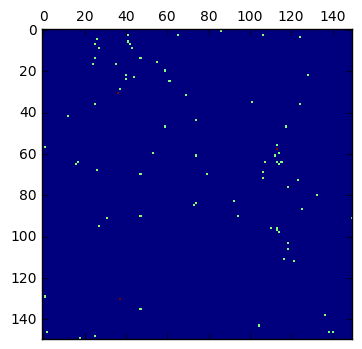

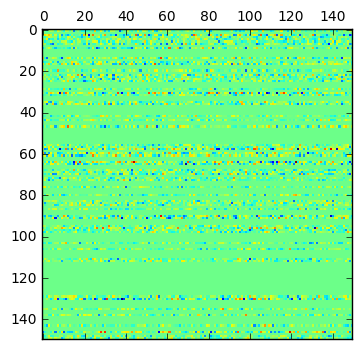

In [17]:
#Cell dedicated to reassembling the density field from amplitudes and phases
phasesnew = np.zeros((nx,ny,nz))
for i in range(0,nx):
    for j in range(0,ny):
        for k in range(0,nz):
            phasesnew[i,j,k] = np.random.uniform(-np.pi,np.pi)

Re_field = amplitudes*np.cos(phasesnew)
Im_field = amplitudes*np.sin(phasesnew)*1j
rebuilt_field = np.fft.ifft(Re_field+Im_field) #Assemble real and imaginary parts into inverse FFT and recreate the density field

plt.figure('Original field')
plt.matshow(overdensities.real[0,:,:])

plt.figure('Rebuilt field')
plt.matshow(rebuilt_field.real[0,:,:])
plt.show()

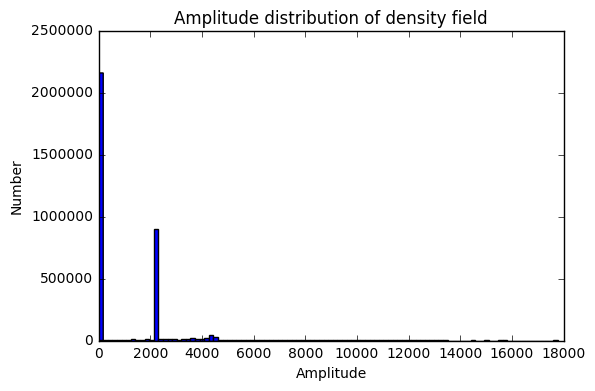

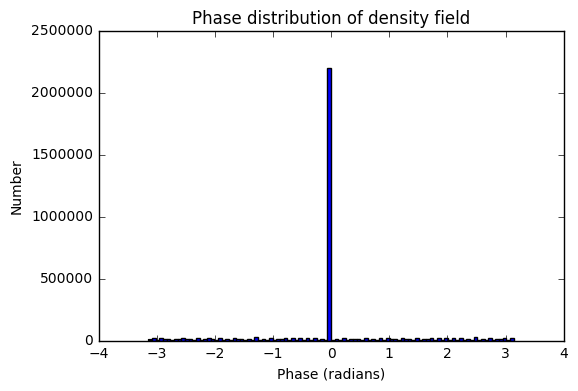

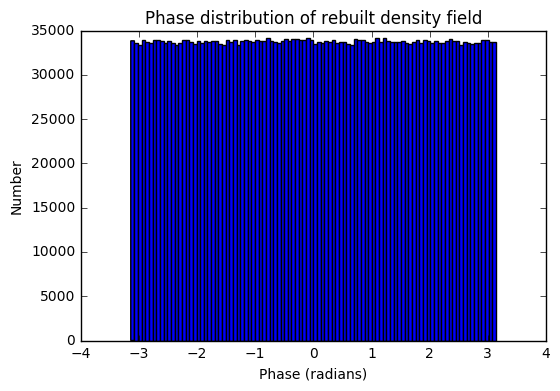

In [18]:
#This cell will be dedicated to plotting the Amplitude and Phase distributions of the entire dataset
plt.figure('Amplitude_dist')
plt.hist(amplitudes.flatten(), bins=100)
plt.title('Amplitude distribution of density field')
plt.ylabel('Number')
plt.xlabel('Amplitude')
plt.show()

plt.figure('phase_dist')
plt.hist(phases.flatten(), bins=100)
plt.title('Phase distribution of density field')
plt.ylabel('Number')
plt.xlabel('Phase (radians)')
plt.show()

plt.figure('phase_dist')
plt.hist(phasesnew.flatten(), bins=100)
plt.title('Phase distribution of rebuilt density field')
plt.ylabel('Number')
plt.xlabel('Phase (radians)')
plt.show()

C:\Users\Simon\Anaconda3\lib\site-packages\ipykernel\__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


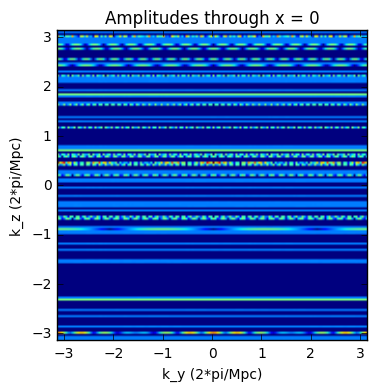

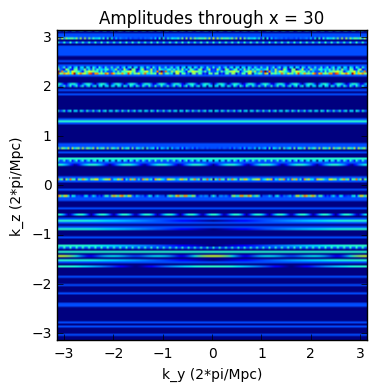

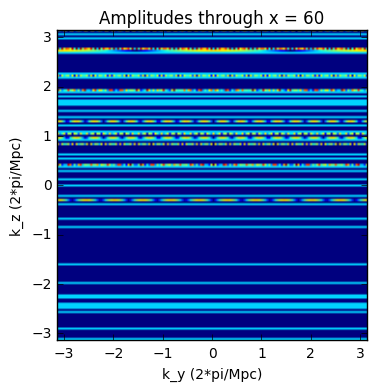

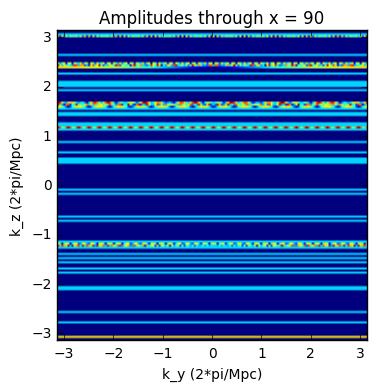

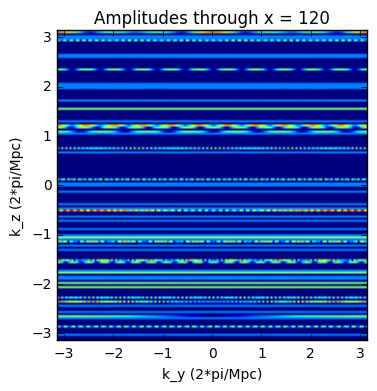

C:\Users\Simon\Anaconda3\lib\site-packages\ipykernel\__main__.py:15: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


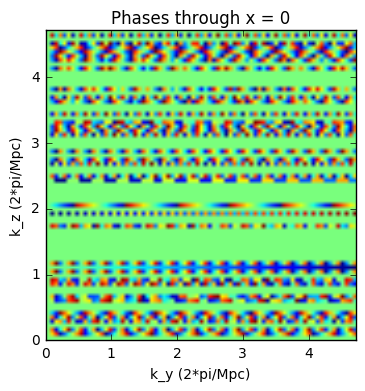

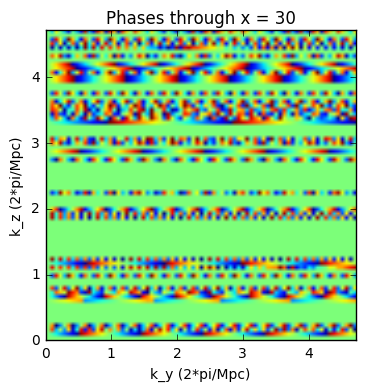

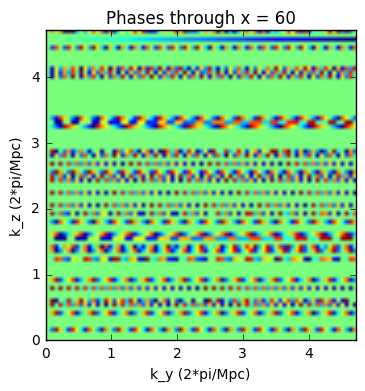

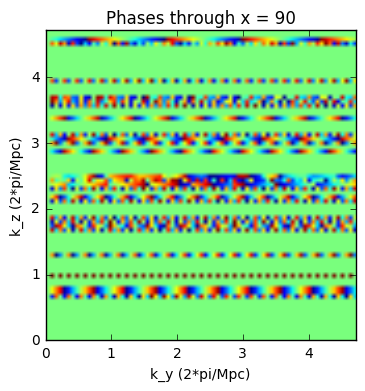

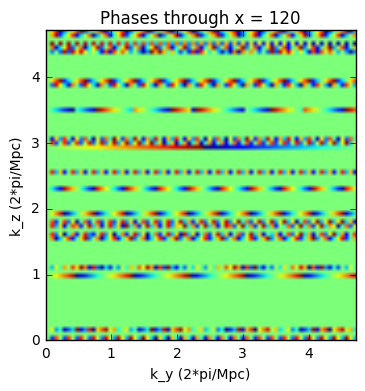

In [19]:
#This cell will be dedicated to plotting the amplitudes and phases of the density field through different slices
x_sections = 5 #Number of slices to take through grid
for t in range(0,x_sections): #Plots a number of 2D slices of the grid
    x_num = t*nx/x_sections
    plt.figure('Amplitudes')
    plt.imshow(amplitudes[x_num,:,:], extent=[-np.pi,np.pi , -np.pi,np.pi])
    plt.title('Amplitudes through x = ' + str(int(x_num)))
    plt.xlabel('k_y (2*pi/Mpc)')
    plt.ylabel('k_z (2*pi/Mpc)')
    plt.show()
    
for t in range(0,x_sections): #Plots a number of 2D slices of the grid
    x_num = t*nx/x_sections
    plt.figure('Phases')
    plt.imshow(phases[x_num,:ny/2,:nz/2], extent=[0 , np.pi*ny/ly, 0, np.pi*nz/lz])
    plt.title('Phases through x = ' + str(int(x_num)))
    plt.xlabel('k_y (2*pi/Mpc)')
    plt.ylabel('k_z (2*pi/Mpc)')
    plt.show()

## Power Spectrum Showcase
Here we demonstrate the procedure of binning total k values and plotting both amplitude and phase power spectra (for both the GiggleZ cutout and the GRF)

In [25]:
#This cell attempts to use the numpy digitize command to bin the 3D array of k_total
binnum = 30 #Number of total bins
kmin = np.min(k_tot)
kmax = np.max(k_tot)
dk = (kmax-kmin)/binnum #Width of a bin
ikbin = np.digitize(k_tot,np.linspace(kmin,kmax,binnum+1)) #Bin the values of k total into binnum
nmodes,pk,pk_err = np.zeros(binnum,dtype=int),np.full(binnum,-1.),np.full(binnum,-1.) #initialize nmodes and power spectrum
amp_pwr = amplitudes**2
GRFamp_pwr = GRFamplitudes**2
phase_pwr = phases**2
GRFphase_pwr = GRFphases**2
binmids=np.zeros(binnum)
binmids = np.linspace(kmin+0.5*dk, kmax-0.5*dk, binnum)

#Initialize other power spectra arrays
GRFpk,phk,GRFphk = np.full(binnum,-1.),np.full(binnum,-1.),np.full(binnum,-1.)
GRFpk_err,phk_err,GRFphk_err = np.full(binnum,-1.),np.full(binnum,-1.),np.full(binnum,-1.)
for ik in range(binnum):
    nmodes[ik] = int(np.sum(np.array([ikbin == ik+1])))
    if (nmodes[ik] > 0):
        #GiggleZ Amp power spectrum
        pk[ik] = np.mean(amp_pwr[ikbin == ik+1])
        pk_err[ik] = np.std(amp_pwr[ikbin == ik+1])/np.sqrt(nmodes[ik]/2)
        #GRF Amp power spectrum
        GRFpk[ik] = np.mean(GRFamp_pwr[ikbin == ik+1])
        GRFpk_err[ik] = np.std(GRFamp_pwr[ikbin == ik+1])/np.sqrt(nmodes[ik]/2)
        #GiggleZ Phase power spectrum
        phk[ik] = np.mean(phase_pwr[ikbin == ik+1])
        phk_err[ik] = np.std(phase_pwr[ikbin == ik+1])/np.sqrt(nmodes[ik]/2)
        #GRF Phase power spectrum
        GRFphk[ik] = np.mean(GRFphase_pwr[ikbin == ik+1])
        GRFphk_err[ik] = np.std(GRFphase_pwr[ikbin == ik+1])/np.sqrt(nmodes[ik]/2)

plt.figure('Amp Power Spec')
plt.scatter(binmids, pk, s=8, color='black')
plt.errorbar(binmids,pk,pk_err)
plt.title('Amplitude Power Spectrum of GiggleZ cutout')
plt.xlabel('Total k value')
plt.ylabel('Amplitude Power')

plt.figure('GRFAmp Power Spec')
plt.scatter(binmids, GRFpk, s=8, color='black')
plt.errorbar(binmids,GRFpk,GRFpk_err)
plt.title('Amplitude Power Spectrum of GRF')
plt.xlabel('Total k value')
plt.ylabel('Amplitude Power')

plt.figure('Phase Power Spec')
plt.scatter(binmids, phk, s=8, color='black')
plt.errorbar(binmids,phk,phk_err)
plt.title('Phase Power Spectrum of GiggleZ cutout')
plt.xlabel('Total k value')
plt.ylabel('Phase Power')

plt.figure('GRFPhase Power Spec')
plt.scatter(binmids, GRFphk, s=8, color='black')
plt.errorbar(binmids,GRFphk,GRFphk_err)
plt.title('Phase Power Spectrum of GRF')
plt.xlabel('Total k value')
plt.ylabel('Phase Power')
plt.show()

NameError: name 'GRFgrid' is not defined

## Phase Gradient Showcase
Here we'll show the overdensity field, the phases and the phase gradients of the chosen density field for a given slice through x. The phase gradient that is being implemented is the one-dimensional form, $D_k \equiv \phi_{k+1}-\phi_k$

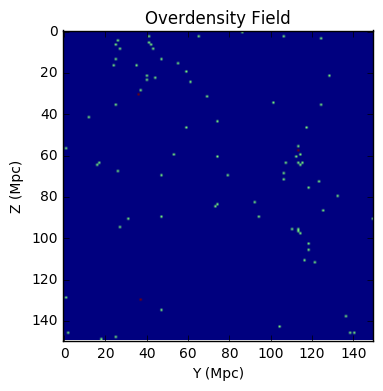

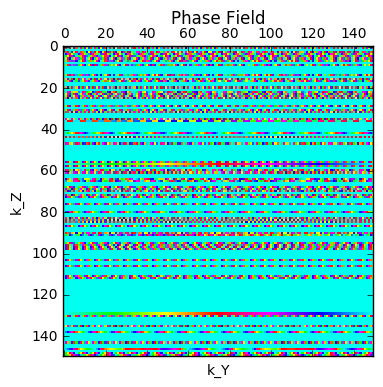

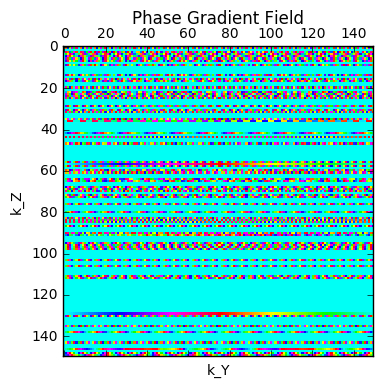

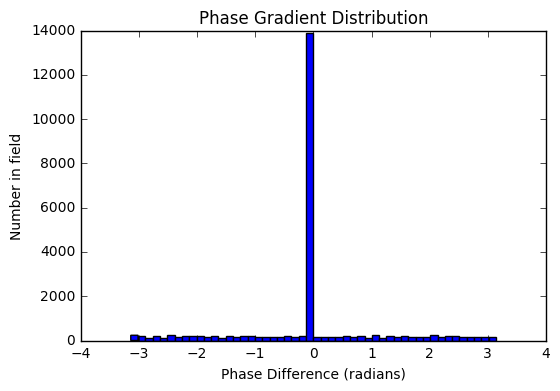

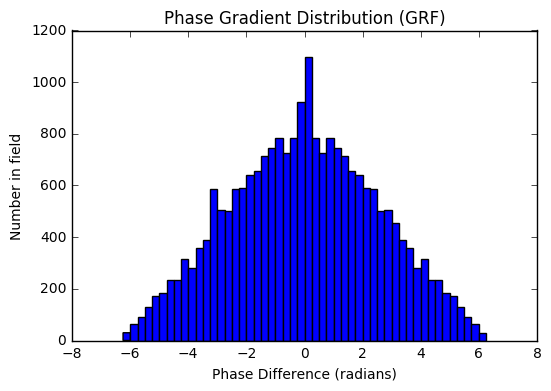

In [21]:
#Plot the overdensity field
xslc = 0
plt.figure('overdensity')
plt.imshow(overdensities.real[xslc,:,:])
plt.title('Overdensity Field')
plt.xlabel('Y (Mpc)')
plt.ylabel('Z (Mpc)')

#Plot the Phase Field
plt.figure('phases')
plt.matshow(phases[xslc,:,:], cmap='hsv')
plt.title('Phase Field')
plt.xlabel('k_Y')
plt.ylabel('k_Z')

#Plot the Phase Gradient Field
plt.figure('Phase Gradient Field')
plt.matshow(phases[xslc,:+1,:]-phases[xslc,:,:], cmap='hsv')
plt.title('Phase Gradient Field')
plt.xlabel('k_Y')
plt.ylabel('k_Z')

#Plot the Phase Gradient Distribution of GiggleZ sample
plt.figure('Phase Gradient Distribution')
plt.hist((phases[xslc,:+1,:]-phases[xslc,:,:]).flatten(),bins=50)
plt.title('Phase Gradient Distribution')
plt.xlabel('Phase Difference (radians)')
plt.ylabel('Number in field')

#Plot the Phase Gradient Distribution of the GRF sample
plt.figure('Phase Gradient Distribution (GRF)')
plt.hist((GRFphases[xslc,:+1,:]-GRFphases[xslc,:,:]).flatten(),bins=50)
plt.title('Phase Gradient Distribution (GRF)')
plt.xlabel('Phase Difference (radians)')
plt.ylabel('Number in field')

plt.show()

The Phase Gradient field has 'streaking' running down the z dimension, perhaps this is a feature of the one-dimensionality of the phase gradient statistic? How can we effectively implement a 3D phase gradient to properly measure a local phase correlation?

The Phase Gradient Distributions appear to be triangular shaped, with a pronounced peak at 0 (A feature of phase correlations). Shouldn't the GRF distribution resemble a uniform distribution, as the GRF phases themselves are a uniform distribution? What causes the Phase Gradient distribution to resemble a triangle?

## Vector form of Phase Gradient
In an attempt to make a 3-dimensional version of the Phase gradient, it should be possible to use the phase gradients in each dimension as a component of a vector. By expanding the definition of phase gradient to a 3-dimensional sense, we arrive at another definition: $D_k \equiv \sqrt{(\phi_{k_{x}+1}-\phi_{k_{x}})^2+(\phi_{k_{y}+1}-\phi_{k_{y}})^2+(\phi_{k_{z}+1}-\phi_{k_{z}})^2}$.

This definition should adequately describe the phase correlations of every point in a 3D space and it should be possible to discern the magnitudes of the individual dimensions with the use of polar coordinate transformations.

We shall also remedy an issue with the previous section, where the phase gradient was not accounting for the fact that $-\pi$ and $\pi$ are the same value.

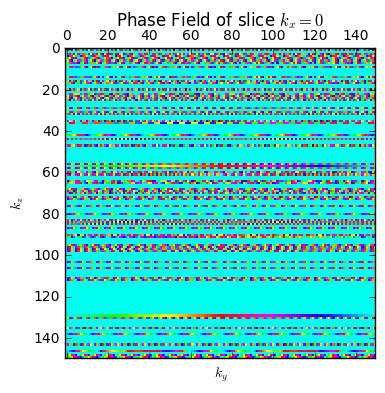

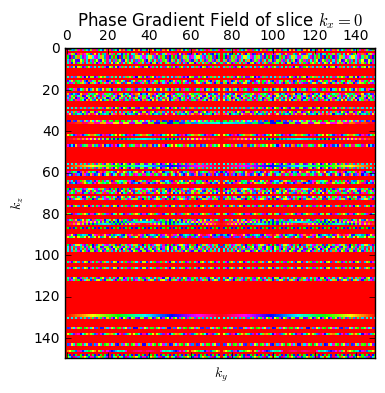

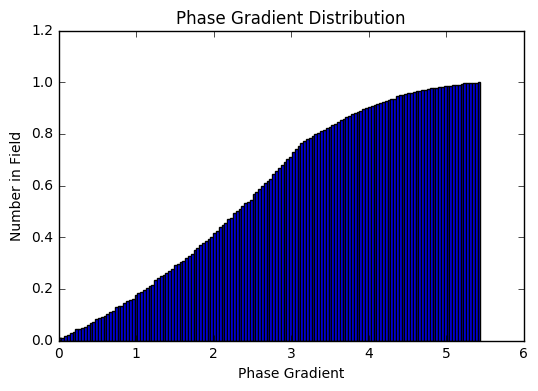

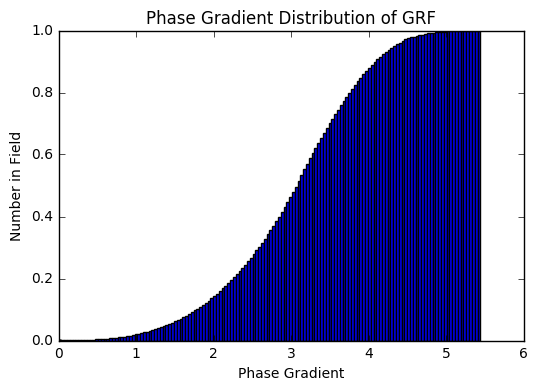

In [22]:
#Create dimensional components of phase gradients
D_kx = phases[:+1,:,:]-phases[:,:,:]
D_ky = phases[:,:+1,:]-phases[:,:,:]
D_kz = phases[:,:,:+1]-phases[:,:,:]
D_grf_kx = GRFphases[:+1,:,:]-GRFphases[:,:,:]
D_grf_ky = GRFphases[:,:+1,:]-GRFphases[:,:,:]
D_grf_kz = GRFphases[:,:,:+1]-GRFphases[:,:,:]

#Fix gradient values above pi and below -pi.
for i in range(nx):
    for j in range(ny):
        for k in range(nz):
            if D_kx[i,j,k] < -np.pi:
                D_kx[i,j,k] += 2*np.pi
            if D_kx[i,j,k] > np.pi:
                D_kx[i,j,k] -= 2*np.pi
            if D_ky[i,j,k] < -np.pi:
                D_ky[i,j,k] += 2*np.pi
            if D_ky[i,j,k] > np.pi:
                D_ky[i,j,k] -= 2*np.pi
            if D_kz[i,j,k] < -np.pi:
                D_kz[i,j,k] += 2*np.pi
            if D_kz[i,j,k] > np.pi:
                D_kz[i,j,k] -= 2*np.pi
                
            if D_grf_kx[i,j,k] < -np.pi:
                D_grf_kx[i,j,k] += 2*np.pi
            if D_grf_kx[i,j,k] > np.pi:
                D_grf_kx[i,j,k] -= 2*np.pi
            if D_grf_ky[i,j,k] < -np.pi:
                D_grf_ky[i,j,k] += 2*np.pi
            if D_grf_ky[i,j,k] > np.pi:
                D_grf_ky[i,j,k] -= 2*np.pi
            if D_grf_kz[i,j,k] < -np.pi:
                D_grf_kz[i,j,k] += 2*np.pi
            if D_grf_kz[i,j,k] > np.pi:
                D_grf_kz[i,j,k] -= 2*np.pi

#Create 3D Phase Gradient Field
D_k = np.sqrt(D_kx**2+D_ky**2+D_kz**2) #Vector Phase Gradient
D_grf_k = np.sqrt(D_grf_kx**2+D_grf_ky**2+D_grf_kz**2) #Vector Phase Gradient of GRF

#Plot Phase Field of slice x=0
plt.figure('phase field')
plt.matshow(phases[0,:,:], cmap='hsv')
plt.title('Phase Field of slice $k_{x} = 0$')
plt.xlabel('$k_y$')
plt.ylabel('$k_z$')
plt.show()

#Plot Phase Gradient Field of slice x=0
plt.figure('phase grad field')
plt.matshow(D_k[0,:,:], cmap='hsv')
plt.title('Phase Gradient Field of slice $k_{x} = 0$')
plt.xlabel('$k_y$')
plt.ylabel('$k_z$')
plt.show()

#Plot Phase Gradient Distribution
plt.figure('phase grad distribution')
plt.hist(D_k[(D_k != 0) & (D_k != np.pi) & (D_k != np.sqrt(2)*np.pi) & (D_k != np.sqrt(3)*np.pi)], bins=150, normed=True, cumulative=True)
plt.title('Phase Gradient Distribution')
plt.xlabel('Phase Gradient')
plt.ylabel('Number in Field')
plt.show()

#Plot Phase Gradient Distribution of GRF
plt.figure('phase grad grf distribution')
plt.hist(D_grf_k[(D_grf_k != 0) & (D_grf_k != np.pi) & (D_grf_k != np.sqrt(2)*np.pi) & (D_grf_k != np.sqrt(3)*np.pi)], bins=150, normed=True, cumulative=True)
plt.title('Phase Gradient Distribution of GRF')
plt.xlabel('Phase Gradient')
plt.ylabel('Number in Field')
plt.show()

The vector form of the phase gradient seems to have worked, with both distributions reaching a maximum possible value of $\sqrt{3\pi^2}$, however the Gaussian Random Field distribution seems to have pronounced peaks at $0$, $\pi$, $\sqrt{2\pi^2}$ and $\sqrt{3\pi^2}$ rather than being a totally random distribution. It also seems that the distributions are not uniform, despite the phases being uniformly distributed (in the GRF case). It appears that the distribution is capable of showing the extent of the phase coupling across the whole space, as the amount of zeros in the GiggleZ cutout is significantly larger (perhaps too significant?) than the remainder of the distribution, indicating that there is significant phase coupling. It should be noted that by increasing the resolution, the number of zeros will increase as there is more empty space in the region(?).

The GRF distribution appears to resemble the histogram of k_tot bins, whilst the calculations predict that the VPG distribution is uniform. It should be possible to model the distribution of k_tot, but I currently do not know the functional form of the distribution of kx, ky or kz.

## Information Entropy Showcase
Information Entropy is the next logical step to take after computing the phase gradient distribution of the density field.
Information Entropy takes the form of $S(D) = -\int f(D) \log[f(D)] dD$, where $f(D)$ is "the frequency distribution of the values of $D_k$ obtained from the whole map" (P. Coles 2000).

It becomes apparent that the next variable to extract from the distribution of phase gradients is the corresponding frequency distribution, $f(D)$. At first we shall attempt to do this extraction on the one-dimensional version of phase gradient, then we shall move onto the three-dimensional vector form.

### Extracting Frequency Distributions and the nature of the Integral
The integral involved in the above equation acts to add all of the components of $D$ together. Considering that the density field has a limited resolution, it should be possible to compute the Information Entropy, $S(D)$, by taking a summation over all pixels instead.

$S(D) = -\sum f(D) \log[f(D)] \Delta D$

The values of $f(D)$ can be found by taking the values of the probability distribution, $P(D)$, over the range of $D_k$ values.

In [23]:
f_D, test1, test2 = plt.hist(D_k.flatten(),bins=nx, normed=True) #Frequency distribution of D_k
f_D_grf, test1, test2 = plt.hist(D_grf_k.flatten(), bins=nx, normed=True) #Frequency distribution of D_grf_k
S_D = -np.sum(f_D*np.log(f_D)*dx) #Information Entropy of GiggleZ sample
S_D_grf = -np.sum(f_D_grf*np.log(f_D_grf)*dx)
print("Information Entropy of GiggleZ sample:",S_D)
print("Information Entropy of GRF sample:",S_D_grf)
print("Information Entropy is",(S_D-S_D_grf)/S_D_grf*100,"% greater in the GiggleZ sample than the GRF sample")

Information Entropy of GiggleZ sample: 16.2265979721
Information Entropy of GRF sample: 23.4267602527
Information Entropy is -30.7347759697 % greater in the GiggleZ sample than the GRF sample


## K-S test showcase
The K-S test demonstrates the degree of which a distribution matches a theoretical fit, or it may be used to measure the degree of which two distributions match a shared parent distribution.

In [24]:
ks1, test1, test2 = plt.hist(D_grf_k[(D_grf_k != 0) & (D_grf_k != np.pi) & (D_grf_k != np.sqrt(2)*np.pi) & (D_grf_k != np.sqrt(3)*np.pi)], bins=nx, normed=True, cumulative=True)
ks2, test1, test2 = plt.hist(D_k[(D_k != 0) & (D_k != np.pi) & (D_k != np.sqrt(2)*np.pi) & (D_k != np.sqrt(3)*np.pi)], bins=150, normed=True, cumulative=True)
kstest = spy.ks_2samp(ks1,ks2)
print(kstest)

Ks_2sampResult(statistic=0.22000000000000003, pvalue=0.00112378990243587)


The pvalue of the above statistic describes the chance that the two distributions are together sampled form a parent distribution. The closer to 0, the less likely the chance.